(theory-to-practice)=
# Connecting theory to practice: a first look at model building

Though you investigated some real-world datasets and scenarios in the programming assignments, essentially everything that we have studied so far belongs to abstract probability theory. In this chapter, we take a first look at _modeling_ while also continuing the discussion begun in the [programming assignment for Chapter 4](https://github.com/jmyers7/stats-book-materials/blob/main/programming-assignments/assignment_04.ipynb) on _empirical distributions_ of datasets. The ultimate goal is to begin connecting our abstract theory to real-world practice.

The modeling concept is bigger than just probability theory, statistics, and machine learning; indeed, the process of model building is central to essentially all quantitative sciences:

```{image} ../img/model-build.svg
:width: 80%
:align: center
```
&nbsp;

Popular stories in the history of western science tell of the search for better and more accurate physical models---the transition from the geocentric Ptolemaic model of the solar system to the heliocentric Copernican one immediately springs to mind as an example.

Mathematical models serve multiple functions in science: an accurate model may be used to test hypotheses and suggest new theories, and it may be used to predict future events. The same is true for the models that we study in this chapter. These new models are _probabilistic_, however, which means that an analyst needs a firm foundation in probability theory to understand the language used to describe the models.

While there are similarities between the models that you may have studied before and the new ones in this chapter, there are some differences as well along with novel use cases. For example, once these probabilistic models have been fully trained and all their parameters have been learned, they may be sampled from, _generating_ new data in the process. This is the realm of _generative models_ and _generative machine learning_. The probabilistic nature of the models means that the new data is random. Those who have no issues using anthropomorphized language to describe the models might refer to this randomness as _creativity_.

But our aims in this chapter are much more limited. We will study univariate models made out of only a _single_ random variable, though it may be "duplicated" many times to produce so-called _IID sequences_ of random variables that serve as theoretical avatars of observed real-world datasets. We will briefly study a few tools and techniques that help us visualize the _shape_ of a dataset; some of these visualization tools will then be used for _model checking_ and to help judge _goodness-of-fit_ for proposed probabilistic models. Later, in {numref}`Chapter %s <prob-models>`, we will embed the univariate models in this chapter into interconnected "webs" of random variables, creating ever more expressive and powerful probabilistic models. But we must learn to walk before we can run!









## Data and random samples

The story begins with a careful study of the stuff that our models are supposed to model: data! Throughout this chapter, we will explore a real-world dataset consisting of listing prices (in USD) for Airbnbs in Austin, Texas, over an observation period of 12 months:

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib_inline.backend_inline
import scipy as sp
import seaborn as sns
from statsmodels.graphics.gofplots import qqplot
import warnings
plt.style.use('../aux-files/custom_style_light.mplstyle')
matplotlib_inline.backend_inline.set_matplotlib_formats('svg')
warnings.filterwarnings('ignore')

srs = pd.read_csv('../aux-files/airbnb-data.csv', usecols=['price']).squeeze()
srs

0        111.97
1         97.62
2         48.48
3        106.66
4        156.66
          ...  
13248    515.50
13249     70.78
13250    297.56
13251    212.29
13252     74.66
Name: price, Length: 13253, dtype: float64

```{margin}
This dataset was obtained [here](http://insideairbnb.com). I removed outliers and also smoothed the data to remove spikes at prices that are multiples of $\$50$.
```

Notice that there are $m=13{,}239$ prices in the dataset.

To fit this dataset into the theoretical framework of the first few chapters, we conceptualize the (hypothetical) collection of *all* possible listings as a probability space $S$. Then, we conceptualize the price of a listing as a random variable

\begin{equation*}
X: S \to \mathbb{R}
\end{equation*}

that takes a listing from the population $S$ as input and spits out its price:

\begin{equation*}
X(\text{listing}) = \text{price}.
\end{equation*}

The actual prices in our dataset are called *observed values* of the random variable $X$ and, as in previous chapters, they are represented with a lowercase $x$. We would list the elements in our dataset as

\begin{equation*}
x_1,x_2,\ldots,x_m \in \mathbb{R}
\end{equation*}

where $m=13{,}239$.

So far, this discussion is not all that different from ones that we have had before; in fact, I can even use the same cartoon from previous chapters to visualize the action of the random variable $X$:

```{image} ../img/airbnb0.svg
:width: 90%
:align: center
```
&nbsp;

However, what makes our current scenario different from those considered in past chapters is that we have an entire dataset of prices at hand, not just a *single* price. How are we to fit *datasets* into our theoretical framework?

The answer is pretty obvious, actually. After all, a collection of $m$ prices like those in our dataset must come from a collection of $m$ listings, right? This suggests that we should simply "duplicate" the random variable $X$ to obtain a *sequence* of random variables

\begin{equation*}
X_1,X_2,\ldots,X_m,
\end{equation*}

where the random variable $X_i$ (for $1\leq i \leq m$) spits out the price of the $i$-th listing. Something like this:

```{image} ../img/cartesian.svg
:width: 90%
:align: center
```
&nbsp;

To make this work, technically we need to replace the sample space $S$ with its $m$-fold <a href="https://en.wikipedia.org/wiki/Cartesian_product#n-ary_Cartesian_power">cartesian power</a>, but we won't worry about these details. For us, it's enough to understand this process at the intuitive level.

Now, what about probability? Remember, I called the population $S$ of all listings a *probability* space, so evidently it must come equipped with a probability measure $P$. But here's the truth:

> We don't actually *care* about $P$.

Indeed, $P$ is a purely academic object whose only role in this business is to make the theory under the hood tick along. It's mostly mathematicians like me that spend time worrying about $P$, but it is *never*, *ever* mentioned or acknowledged in real-world scenarios.

On the other hand, we do very much(!) care about the probability distributions of the random variables $X_1,X_2,\ldots,X_m$. We will be devoting a huge amount of time and effort over the rest of this course trying to figure out the distribution of this or that random variable. In the context of our Airbnb prices, the distributions of the $X_i$'s tell us the distribution of prices:

```{image} ../img/airbnb.svg
:width: 90%
:align: center
```
&nbsp;

But because each of the random variables $X_i$ is essentially a "duplicate" of the single random variable $X$, they all have the *same* distribution, in the sense that

\begin{equation*}
P(X_1\in A) = P(X_2\in A) = \cdots = P(X_m\in A)
\end{equation*}

for all events $A\subset \mathbb{R}$. If we draw each of the random variables along with their distributions, we would get:

```{image} ../img/iid.svg
:width: 100%
:align: center
```
&nbsp;

Notice that all the distributions are the same! This leads us to one of the main definitions in this entire course:

```{prf:definition}
:label: random-sample-defn

Let $X_1,X_2,\ldots,X_m$ be a sequence of random variables, all defined on the same probability space.

* The random variables are called a *random sample* if they are *independent* and *identically distributed* (IID).

Provided that the sequence is a random sample, an *observed random sample*, or a *dataset*, is a sequence of real numbers $x_1,x_2,\ldots,x_m$ where $x_i$ is an observed value of $X_i$. We shall also refer to a dataset as an _observation_ of the corresponding random sample.
```

Two random variables are said to be *independent* if the probability of one of the random variables taking a particular value is not influenced or affected by the other random variable taking a particular value. This isn't a precise definition, and it must be adapted to apply to an entire *sequence* of random variables, but it is good enough for now. (The precise definition will come in {prf:ref}`independence-defn`.)

Take care to notice the difference between a *random sample* (without the modifier) and an *observed random sample*---the former is an IID sequence of random variables, while the latter is a sequence of real numbers!

Why have two different types of random samples? Answers:

```{admonition} The roles of random samples

* Observed random samples $x_1,x_2,\ldots,x_m$ are the datasets that we work with in the real world. It is therefore obvious why we care about these.

* We use random samples $X_1,X_2,\ldots,X_m$ when we want to reason theoretically about the observed random samples that we encounter in the real world. For example, suppose that you want to prove that some type of statistical estimator or machine learning algorithm works well for *any* dataset. Then you *must* argue using random samples consisting of IID random variables!
```
























(prob-models-emp-sec)=
## Probabilistic models and empirical distributions

Suppose we conceptualize our Airbnb dataset $x_1,x_2,\ldots,x_m$ as an observation of a random sample $X_1,X_2,\ldots,X_m$. Since the random variables in the random sample are identically distributed, they all induce the _same_ probability distribution on $\mathbb{R}$. _But what is this distribution?_

Whatever it is, it is _not_ completely and uniquely determined by the dataset. Its specific identity is chosen by the analyst. Many factors are considered in this choice, but the most important is to pick a distribution that closely _fits_ the empirical distribution of the dataset. This is the modeling process in a nutshell.

Let's introduce some notation and terminology. Suppose that $X_1,X_2,\ldots,X_m$ is _any_ random sample. If the common probability distribution among the $X_i$'s comes from one of the families studied in {numref}`Chapter %s <examples>`---for example, a normal distribution---we will write the usual

```{math}
:label: normal-model-eqn

X_1,X_2,\ldots,X_m \sim \mathcal{N}(\mu,\sigma^2). 
```

We will also sometimes write

\begin{equation*}
X_1,X_2,\ldots,X_m \sim F
\end{equation*}

where $F$ is the common distribution function shared among the $X_i$'s. We may also write the density function $f$ or mass function $p$ in place of $F$. In any case, a particular choice of $F$ (or $f$ or $p$) is called a _probabilistic model_. The modeling process may then be described as _choosing_ a probabilistic model.

There are both _parametric_ and _non-parametric_ probabilistic models. A normal model of the form {eq}`normal-model-eqn` belongs to the former type, since it depends on the parameters $\mu$ and $\sigma^2$. Proposing a parametric probabilistic model is then only half the battle, for then the parameters must be determined to completely specify the model. A machine learning engineer would say that the parameters are _learned_ from a given dataset (see {numref}`Chapter %s <learning>`), while a statistician would say that they are _inferred_ from data.

As we will learn in {numref}`Chapter %s <prob-models>`, the random variables and parameters in a probabilistic model may be depicted graphically; for a normal model {eq}`normal-model-eqn` with $m=3$, we would draw the following picture:

```{image} ../img/norm-model.svg
:width: 50%
:align: center
```
&nbsp;

The arrows in this simple graph are intended to convey "influence"---that different parameter settings will alter or "influence" the distributions of the $X_i$'s. Admittedly, since the normal model is so simple, there isn't much additional insight to be gained by drawing this graph. But it's good practice for the models in {numref}`Chapter %s <prob-models>`.

How do we judge the _goodness-of-fit_ of a proposed model distribution? Our first method will be based on a visual comparison of the model distribution function to the _empirical distribution function_. The latter is defined in the next box, which also contains a reminder of the definition of an _empirical distribution_ that appeared back in the [programming assignment for Chapter 4](https://github.com/jmyers7/stats-book-materials/blob/main/programming-assignments/assignment_04.ipynb).

````{prf:definition}
:label: emp-dist-defn

The *empirical distribution* of a dataset $x_1,x_2,\ldots,x_m$ is the discrete probability measure on $\mathbb{R}$ with probability mass function

```{math}
p(x) = \frac{\text{frequency of $x$ in the dataset}}{m}.
```

The *empirical cumulative distribution function* (_ECDF_) of the dataset is the CDF of the empiricical disribution. It is given by

\begin{equation*}
F(x) = \sum_{x^\star\leq x} p(x^\star) = \frac{\text{number of data points that are $\leq x$}}{m}.
\end{equation*}
````

Notice that the probability $p(x)$ is the _relative frequency_ of $x\in \mathbb{R}$; it is exactly the frequency that $x$ appears in the dataset, divided by the size of the dataset.

To make this concrete, let's bring back the Airbnb prices. I have asked the computer to generate the ECDF of this dataset:

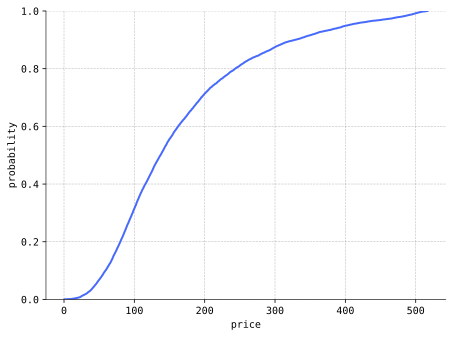

In [2]:
sns.ecdfplot(data=srs)
plt.xlabel('price')
plt.ylabel('probability')
plt.tight_layout()

Remember, the CDFs of discrete distributions are step functions. So why doesn't _this_ look like a step function? Essentially, the data points are so numerous and packed together so tightly along the $x$-axis that we can't see the steps. But rest assured, if we were to zoom in, we'd see them.

```{margin}

Actually, it's not quite right to say that the empirical variance $s^2$ is the parameter estimate derived from the method of moments or maximum likelihood estimation. In fact, the latter estimates have the sample size $m$ in the denominator, whereas the empirical variance $s^2$ is usually defined with $m-1$ in the denominator.
```

Now, suppose that our Airbnb dataset is an observation of a random sample $X_1,X_2,\ldots,X_m$ (where $m=13{,}239$) and that we propose a normal model

$$
X_1,X_2,\ldots,X_{m} ; \mu,\sigma^2 \sim \mathcal{N}(\mu,\sigma^2).
$$

How might we "learn" the parameters $\mu$ and $\sigma^2$ from the data? In this case, we might choose $\mu$ and $\sigma^2$ to be the _empirical mean_ $\bar{x}$ and _empirical variance_ $s^2$, which you saw back in the [programming assignment for Chapter 4](https://github.com/jmyers7/stats-book-materials/blob/main/programming-assignments/assignment_04.ipynb) and which we will review in {numref}`empirical-stats` below. (This is the _method of moments_ for estimating model parameters which, in this special case, is also the method of _maximum likelihood estimation_; see {numref}`Chapter %s <learning>`.) With these parameter settings, let's plot the ECDF of the dataset along with the CDF of the normal model superimposed:

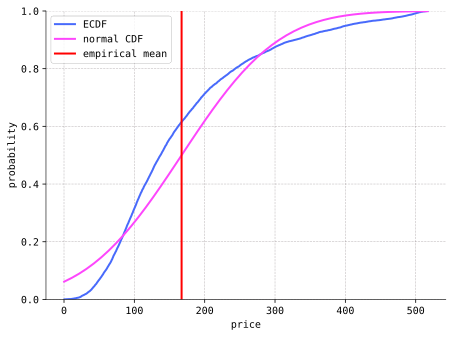

In [3]:
xbar = srs.mean()
s = srs.std()
X = sp.stats.norm(loc=xbar, scale=s)
grid = np.linspace(srs.min(), srs.max())

sns.ecdfplot(data=srs, label='ECDF')
plt.plot(grid, X.cdf(grid), label='normal CDF')
plt.axvline(x=xbar, color='r', label='empirical mean')
plt.xlabel('price')
plt.ylabel('probability')
plt.legend()
plt.tight_layout()

Yikes. Those CDFs are quite different from each other, suggesting that the normal model is a bad fit.

All is not lost, however, since this comparison suggests a better model. Though technically the ECDF is a step function, it _appears_ to us as a nice smooth-ish curve. If we pretend that it actually _is_ a smooth curve, then the empirical distribution has a probability density function. This density function should have a local maximum around a price of $\$100$ since the ECDF appears to have an inflection point near that price. As we continue scanning the graph from left to right beginning at $\$100$, we see that the tangent line slopes of the ECDF gradually decrease toward $0$, but that it takes awhile before the slopes are essentially $0$. This suggests that the dataset is _right-skew_, in the sense that it has a long tail reaching out to the right from its (single) peak.

This analysis suggests that a log transform (which you learned about in the [programming assignment for Chapter 4](https://github.com/jmyers7/stats-book-materials/blob/main/programming-assignments/assignment_04.ipynb)) might "un-skew" the data by removing the tail. In place of our (bad) normal model, we thus propose a normal model on the _transformed_ data:

$$
\log{X_1},\log{X_2},\ldots,\log{X_{m}} ; \mu,\sigma^2 \sim \mathcal{N}(\mu,\sigma^2).
$$

We take the model parameters $\mu$ and $\sigma^2$ as the empirical mean and variance of the log-transformed data. Here's a CDF comparison:

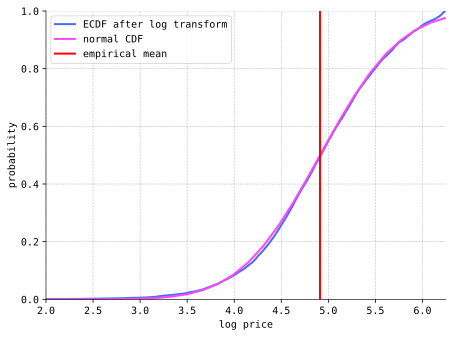

In [4]:
srs_log = np.log(srs)
xbar = srs_log.mean()
s = srs_log.std()
X = sp.stats.norm(loc=xbar, scale=s)
grid = np.linspace(srs_log.min(), srs_log.max())

sns.ecdfplot(data=srs_log, label='ECDF after log transform')
plt.plot(grid, X.cdf(grid), label='normal CDF')
plt.xlim(2, srs_log.max())
plt.axvline(x=xbar, color='r', label='empirical mean')
plt.xlabel('log price')
plt.ylabel('probability')
plt.legend()
plt.tight_layout()
#plt.savefig('ecdf-compare-log.pdf')

```{margin}

By the way, datasets whose log transforms are well modeled by normal distributions occur quite frequently. So frequently, in fact, that we refer to these datasets as [log-normally distributed](https://en.wikipedia.org/wiki/Log-normal_distribution#).
```

That looks pretty good! There is a slight discrepancy beginning around $6$ on the horizontal axis where the normal CDF flattens while the ECDF remains steep. This means that the amount of probability density of the (log-transformed) dataset in this region is _larger_ than predicted by the normal model.

If we elect to use the normal model on the log-transformed data, we need to remember that any information we learn about the data through the model needs to be "back-transformed" using the exponential function to translate to the original dataset.

































## Histograms

In the previous section, we used a plot of the ECDF of the Airbnb prices in order to _visualize_ the empirical distribution. From this plot, we were able to get a sense of the _shape_ of the dataset that informed our choice of probabilistic model.

There are a few more ways that we might attempt to visualize the empirical distribution. Indeed, since the empirical distribution of the Airbnb prices is technically discrete, we might attempt to visualize it using the probability histograms that we saw in {numref}`prob-histo` and implemented in the [thrid programming assignment](https://github.com/jmyers7/stats-book-materials/tree/main/programming-assignments). However, as we saw in the previous section, the data points in our sample are so numerous and packed so closely together that such a probability histogram would be essentially useless. We would have $10{,}666$ bars in our histogram, one for each unique price in our dataset!

But here's an idea: Suppose we "bin together" nearby prices along the $x$-axis _before_ we draw the histogram. In other words, imagine we chop up the $x$-axis into smaller subintervals called _bins_, and then group together nearby data points in these bins. Here's an example using a toy dataset consisting of $m=14$ points:

```{image} ../img/bins1.svg
:width: 100%
:align: center
```
&nbsp;

In the figure on the right, there are seven bins, labeled $B_1,B_2,\ldots,B_7$. The number of bins can either be chosen explicitly by us, or we can let the computer choose the "optimal" number of bins based on some rule of thumb. Either way, the number $k$ of bins need not be $7$.

Now, to draw the "binned" histogram, we put a rectangle on top of each bin:

```{image} ../img/bins.svg
:width: 70%
:align: center
```
&nbsp;

The heights of the rectangles must satisfy _two_ properties: (1) Their areas must sum to $1$, and (2) their heights must be proportional to the number of data points that fall within the bins. For example, you can see that the taller rectangles in the figure contain _more_ data points in their base bins. If $k$ is the total number of bins and $m$ is the size of the data set, then to satisfy both these properties, we can choose the $j$-th rectangle (for $j=1,2,\ldots,k$) to have height

\begin{equation*}
\frac{\text{number of data points in $j$-th bin}}{m \times (\text{width of $j$-th bin})}.
\end{equation*}

Of course, computers are capable of plotting these types of histograms. Here is one for our Airbnb prices:

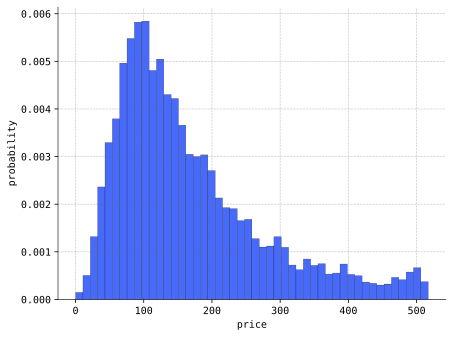

In [5]:
sns.histplot(data=srs, ec='black', stat='density', alpha=1)
plt.xlabel('price')
plt.ylabel('probability')
plt.tight_layout()

The histogram shows the right-skew suggested by the plot of the ECDF in the previous section. There is also a peak in the data around $\$500$, which on the log scale is near $6.2 \approx \log{500}$. This peak was suggested by the plot of the ECDF of the log-transformed data.

Be warned, however, that the shapes of histograms are sensitive to the number of bins. Here's a histogram of the Airbnb data with 200 bins:

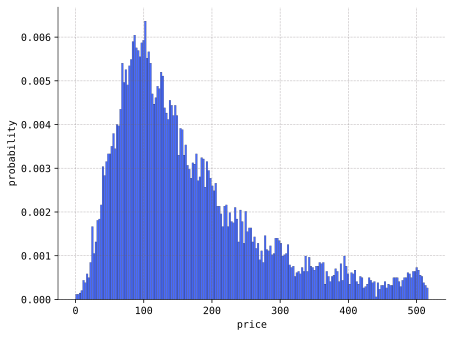

In [6]:
sns.histplot(data=srs, ec='black', stat='density', bins=200, alpha=1)
plt.xlabel('price')
plt.ylabel('probability')
plt.tight_layout()

When too many bins are used, the resulting histogram is "spiky". Some spikes might be significant, but often they are just reflections of random variability and anomalies in the data that we don't want to model.

At the other extreme, here's a histogram with three bins:

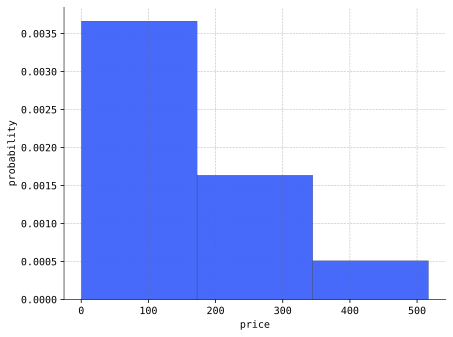

In [7]:
sns.histplot(data=srs, ec='black', stat='density', bins=3, alpha=1)
plt.xlabel('price')
plt.ylabel('probability')
plt.tight_layout()

Except for the right-skew, there's not much else that we could learn about the shape of the dataset from this histogram.

We may use histograms for model checking by generating or simulating new data. To do this, we sample $m=13{,}239$ new data points from our log-normal model from the previous section. Then, we back-transform using the exponential function to move the simulated data from the log-price scale to the price scale. If we then generate a combined histogram of the true dataset and the simulated one, we get this:

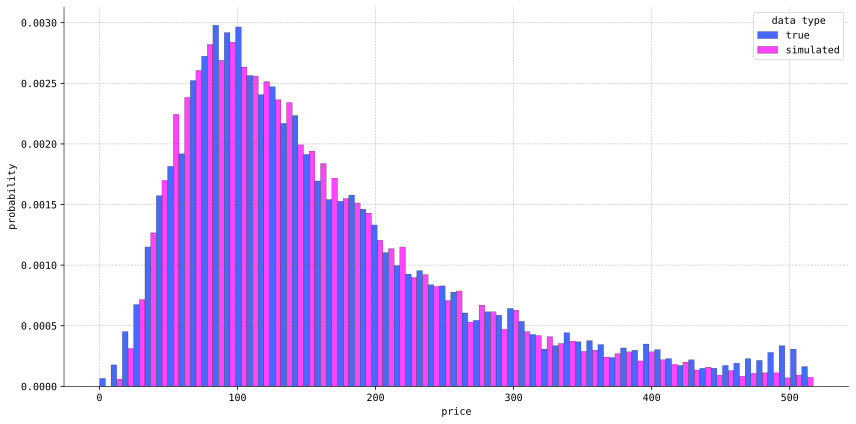

In [8]:
np.random.seed(42)
sample = np.exp(X.rvs(size=len(srs)))
mask = (srs.min() <= sample) & (sample <= srs.max())
df_sample = pd.DataFrame({'price': sample[mask]})
df_sample['data type'] = 'simulated'
df_true = pd.DataFrame({'price': srs})
df_true['data type'] = 'true'
df = pd.concat(objs=[df_true, df_sample], axis=0)

sns.histplot(data=df, x='price', stat='density', ec='black', hue='data type', multiple='dodge', alpha=1)
plt.gcf().set_size_inches(w=12, h=6)
plt.xlabel('price')
plt.ylabel('probability')
plt.tight_layout()

Again, the discrepancy around $\$500$ is apparent; the log-normal model is incapable of capturing that local peak.

How do you choose the number of bins in a histogram? First, you might let the computer decide for you, using the default setting. This default setting is often based off of rules of thumb that have been demonstrated to work well for some reason or another. Then, you can play with the number of bins manually, fine-tuning the number until you get a figure that you believe most accurately represents the shape of the data.























## Kernel density estimation

Though the empirical distribution of the Airbnb dataset is discrete, its ECDF _appears_ to be a continuous curve. If we pretend that it _is_ continuous, then the dataset should have a density function. What would this density function look like?

If you recall that the density function is the derivative of the distribution function, then you may use the shape of the latter along with your curve sketching skills from calculus to get a sense of the shape of the density curve. But computers are capable of estimating density functions directly from the data. In this section, we will briefly explore one such way, called _kernel density estimation_ (_KDE_).

Naturally, a kernel density estimation begins by choosing the _kernel_, which is a function that has a "bell shape," not unlike the normal density curve. In fact, one can even _choose_ the normal density curve as the kernel, and then one obtains _Gaussian KDE_. These will be the only types of kernels that we will consider.

Imagine for simplicity that we have three data points along the $x$-axis. The idea is then to place three kernels (i.e., normal density curves) directly over top of the data points. We then _sum_ the kernels and divide by $3$ (to normalize the area under the curve to $1$), obtaining a _kernel density estimate_. The width of the kernel is controlled by a parameter called _bandwidth_, denoted $h$, which coincides with the standard deviation of the normal distribution in the case of Gaussian KDE. So, large values of $h$ correspond to wide kernels, and smaller values correspond to narrow or "spiky" kernels. Here are three examples of Gaussian KDE with different values of $h$ for our toy dataset consisting of three points:

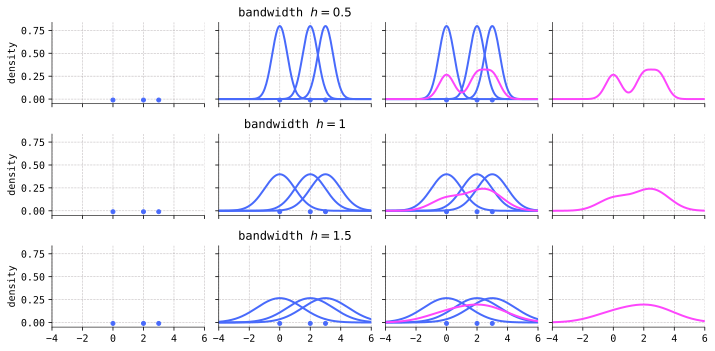

In [9]:
x = np.linspace(-4, 6, 200)
fig, axes = plt.subplots(nrows=3, ncols=4, sharey=True, sharex=True, figsize=(10, 5))
bandwidths = [0.5, 1, 1.5]

for h in bandwidths:
    idx = bandwidths.index(h)
    blue = '#486AFB'
    magenta = '#FD46FC'

    y1 = sp.stats.norm.pdf(x / h) / h
    y2 = sp.stats.norm.pdf((x - 2) / h) / h
    y3 = sp.stats.norm.pdf((x - 3) / h) / h

    axes[idx, 0].plot(0, -0.01, 'o', color=blue)
    axes[idx, 0].plot(2, -0.01, 'o', color=blue)
    axes[idx, 0].plot(3, -0.01, 'o', color=blue)
    axes[idx, 0].set_xlim(-4, 6)
    axes[idx, 0].set_ylabel('density')

    axes[idx, 1].plot(x, y1, )
    axes[idx, 1].plot(x, y2, color=blue)
    axes[idx, 1].plot(x, y3, color=blue)
    axes[idx, 1].plot(0, -0.01, 'o', color=blue)
    axes[idx, 1].plot(2, -0.01, 'o', color=blue)
    axes[idx, 1].plot(3, -0.01, 'o', color=blue)
    axes[idx, 1].set_title(rf'bandwidth $h={h}$')

    axes[idx, 2].plot(x, y1, )
    axes[idx, 2].plot(x, y2, color=blue)
    axes[idx, 2].plot(x, y3, color=blue)
    axes[idx, 2].plot(0, -0.01, 'o', color=blue)
    axes[idx, 2].plot(2, -0.01, 'o', color=blue)
    axes[idx, 2].plot(3, -0.01, 'o', color=blue)
    axes[idx, 2].plot(x, (y1 + y2 + y3) / 3, label='sum of kernels')

    axes[idx, 3].plot(x, (y1 + y2 + y3) / 3, label='sum of kernels', color=magenta)

plt.tight_layout()

Reading from left to right, here's what's going on:

* The plots in the first column display the original three data points.

* In the second column, you see the normal density curves over top of the data points for three different values of the bandwidth $h$.

* In the third column, I have plotted the _sum_ of the three normal density curves (divided by $3$), which are, by definition, the KDEs generated from the data set.

* In the last column, I have plotted the KDEs on their own.

Of course, nobody would ever use KDE for a dataset with only three numbers. But a KDE for our Airbnb dataset would consist of $m=13{,}239$ kernels, one for each data point! Here are three KDEs for the Airbnb prices, with different bandwidths:

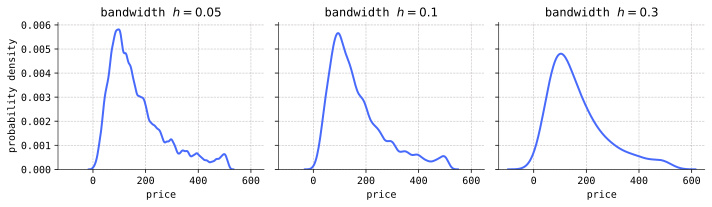

In [10]:
bandwidths = [0.05, 0.1, 0.3]
fig, axes = plt.subplots(nrows=1, ncols=3, sharey=True, sharex=True, figsize=(10, 3))

for h in bandwidths:
    idx = bandwidths.index(h)
    sns.kdeplot(data=srs, ax=axes[idx], bw_method=h)
    axes[idx].set_xlabel('price')
    axes[idx].set_title(f'bandwidth $h={h}$')
    
axes[0].set_ylabel('probability density')
plt.tight_layout()

Smaller values of the bandwidth $h$ correspond to "spikier" kernels and hence "spikier" density estimates. Larger values of $h$ correspond to smoother estimates. In the first two KDEs above, the local peak around $\$500$ is apparent, but the (relatively) large bandwidth $h=0.3$ in the last KDE appears to have "over-smoothed" the estimate and we've lost most of that peak.

How do you choose the bandwidth in a KDE? Just like the "number of bins" parameter for histograms, you are best off first letting the computer decide the bandwidth for you, and then manually fine-tune it (if needed) until you get a KDE that you believe best represents the data.


















(empirical-stats)=
## Empirical statistics

Before we continue discussing more ways to _visualize_ datasets, we need to discuss numerical summaries of datasets. This section is essentially a recapitulation of what you learned in the [programming assignment for Chapter 4](https://github.com/jmyers7/stats-book-materials/blob/main/programming-assignments/assignment_04.ipynb) with a few new things thrown in at the end.

Let's begin our discussion by returning to a general IID random sample

\begin{equation*}
X_1,X_2,\ldots,X_m \sim F,
\end{equation*}

where $F$ represents the (unknown) distribution function corresponding to a probabilistic model. Suppose that the model distribution has a mean $\mu$ and a variance $\sigma^2$, so that

\begin{equation*}
E(X_i) = \mu \quad \text{and} \quad V(X_i) = \sigma^2,
\end{equation*}

for each $i=1,2,\ldots,n$. Based on an observed random sample

\begin{equation*}
x_1,x_2,\ldots,x_m,
\end{equation*}

how might we estimate the unknown model parameters $\mu$ and $\sigma$?

```{prf:definition}
:label: empirical-stats-def

The *empirical mean* of a dataset $x_1,x_2,\ldots,x_m$ is defined to be the number

\begin{equation*}
\bar{x} = \frac{1}{m} \sum_{i=1}^m x_i,
\end{equation*}

while the *empirical variance* is defined to be the number

\begin{equation*}
s^2 = \frac{1}{m-1} \sum_{i=1}^m (x_i - \bar{x})^2.
\end{equation*}

The *empirical standard deviation* $s$ is defined as the positive square root of the empirical variance, $s = \sqrt{s^2}$.
```

The empirical mean $\bar{x}$ and standard deviation $s$ are supposed to serve as data-based estimates for the model mean $\mu$ and standard deviation $\sigma$.

I should mention that the empirical quantities we just defined are often called the _sample mean_, _sample variance_, and _sample standard deviation_. However, as we will see later, our empirical quantities turn out to be observed values of certain _estimators_ that are also called the _sample mean_, _sample variance_, and _sample standard deviation_. Since I believe that it is important---at least at first---to distinguish between an **estimate** and an **estimator**, I have decided to refer to $\bar{x}$, $s^2$, and $s$ as _empirical quantities_ rather than _sample quantities_. In later chapters, however, I will not be so careful, and will refer to $\bar{x}$, $s^2$, and $s$ as _sample quantities_.

```{margin}
By the way, the replacement of $1/m$ with $1/(m-1)$ in the empirical variance is sometimes called [Bessel's correction](https://en.wikipedia.org/wiki/Bessel%27s_correction).
```

The definitions of $\bar{x}$ and $s^2$ are surely quite natural, _except_ that the empirical variance involves division by $m-1$ instead of the sample size $m$ like you might have expected. The reason for this is that, if we had a factor of $1/m$ in $s^2$ instead of $1/(m-1)$, then the value of $s^2$ would _systematically_ underestimate the true value $\sigma^2$ over repeated sampling. This can be demonstrated empirically through computer simulation, and it can also be _proved_ theoretically as we will see later when we study bias of estimators. So for now, we will just take the above definition of $s^2$ on faith, postponing till a later discussion the explanation regarding _why_ it's a good estimator.

Though the empirical quantities $\bar{x}$, $s^2$, and $s$ all have definitions that closely mimic their counterparts $\mu$, $\sigma^2$, and $\sigma$, the definition of the _empirical quantiles_ of a dataset is a bit further removed from the definition of quantiles that we learned back in {numref}`Chapter %s <random-variables>`. Here is the definition:

````{prf:definition}
:label: emp-quantile-defn

Let $x_1,x_2,\ldots,x_m$ be a dataset, written in non-decreasing order:

```{math}
:label: listing-eqn
x_1 \leq x_2 \leq \cdots \leq x_m.
```

For each $i=1,2,\ldots,m$, the datapoint $x_i$ is called the _empirical $q_i$-quantile_ where

```{math}
:label: quantile-eqn
q_i  = \frac{i-1}{m-1}.
```
````

This definition appeared in the [programming assignment for Chapter 4](https://github.com/jmyers7/stats-book-materials/blob/main/programming-assignments/assignment_04.ipynb), where I explained that the intuition for the formula {eq}`quantile-eqn` for $q_i$ is that it is precisely the proportion of data points (excluding) $x_i$ that fall to the _left_ of $x_i$ in the listing {eq}`listing-eqn`. I also explained in that assignment how one goes about computing the empirical $q$-quantile where $q$ is a number (between $0$ and $1$, inclusive) that is _not_ of the form {eq}`quantile-eqn`: The default method in the Pandas library is linear interpolation.

The empirical 0.25-, 0.5-, and 0.75-quantiles are called the _first_, _second_, and _third quartiles_. For the Airbnb dataset, these are listed in the following printout on the lines labeled $25\%$, $50\%$ and $75\%$:

In [11]:
srs.describe()

count    13253.000000
mean       167.168658
std        108.275932
min          0.190000
25%         88.840000
50%        137.130000
75%        216.840000
max        516.960000
Name: price, dtype: float64

Along with the empirical quartiles, you also see that this method from the Pandas library conveniently outputs the empirical mean and standard deviation, as well as the size of the dataset (the _count_) and the minimum and maximum sample values.

The range over which the middle 50% of a dataset sits is defined in:

```{prf:definition}
:label: empirical-iqr-def

The _empirical interquartile range_ (_empirical IQR_) of a dataset $x_1,x_2,\ldots,x_m$ is the difference

\begin{equation*}
(\text{empirical 0.75-quantile}) - (\text{empirical 0.25-quantile}).
\end{equation*}
```

So, using the outputs above, we see that the empirical IQR of the Airbnb dataset is:

In [12]:
iqr_airbnb = srs.quantile(q=0.75) - srs.quantile(q=0.25)
iqr_airbnb

128.0

With the definition of _empirical IQR_ in hand, we may now define _outliers_:

```{prf:definition}
:label: outlier-def

Let $x_1,x_2,\ldots,x_m$ be a dataset. Then a data point $x_i$ is called an _outlier_ if it is above an upper threshold value

\begin{equation*}
x_i > (\text{empirical 0.75-quantile}) + 1.5\times (\text{empirical IQR}),
\end{equation*}

or if it is below a lower threshold value

\begin{equation*}
x_i < (\text{empirical 0.25-quantile}) - 1.5\times (\text{empirical IQR}).
\end{equation*}
```

There's a very convenient way to _visually_ summarize all these empirical statistics (along with outliers) which we will discuss in the last section of this chapter.

























## QQ-plots

```{margin}

I should mention that there are other types of plots closely related to QQ-plots, called _probability plots_ and _PP-plots_. In fact, there seems to be some disagreement as to whether what I am describing in this section actually _is_ a QQ-plot. But this all seems to me to be uninteresting academic pedantry.
```

We learned in the [programming assignment for Chapter 4](https://github.com/jmyers7/stats-book-materials/blob/main/programming-assignments/assignment_04.ipynb) how to produce a plot of the empirical quantiles of a dataset. In this section, we will learn how to produce a plot that compares these empirical quantiles to the (theoretical) quantiles of a proposed model distribution. These new types of plots are called _quantile-quantile plots_ or _QQ-plots_.

Though the basic idea behind a QQ-plot is quite simple, it demands that we slightly alter the definition of _empirical quantiles_ given in the previous section and the [programming assignment for Chapter 4](https://github.com/jmyers7/stats-book-materials/blob/main/programming-assignments/assignment_04.ipynb). Indeed, according to that definition, the minimum and maximum values in a dataset are the $0$- and $1$-quantiles, respectively. But we will run into trouble if we are going to compare these to the quantiles of theoretical model distributions which might not have $0$- and $1$-quantiles.

To help motivate the new definition, for convenience, let's suppose that the points in our dataset are labeled with $y$'s instead of $x$'s. (You'll see why this is convenient, in just a moment.) Suppose that we put our dataset in non-decreasing order,

\begin{equation*}
y_1 \leq y_2 \leq \cdots \leq y_m,
\end{equation*}

where (as usual) $m$ is the size of the dataset. Then, instead of identifying quantiles through the association

\begin{equation*}
y_i \leftrightarrow q_i = \frac{i-1}{m-1}
\end{equation*}

as we did in {prf:ref}`emp-quantile-defn`, we instead make the association

```{math}
:label: quant-eqn
y_i \leftrightarrow q_i =\frac{i-1/2}{m},
```

for $i=1,2,\ldots,m$. For a specific example, suppose that $m=5$ and that all the data points are distinct. Then, if we plot our dataset along an axis along with the labels {eq}`quant-eqn`, we get the following picture:

```{image} ../img/quant.svg 
:width: 80%
:align: center
```
&nbsp;

Notice that the minimum and maximum values are no longer the $0$- and $1$-quantiles, but instead the $0.1$- and $0.9$-quantiles.

Now, suppose that we thought that our data was well modeled by a probability distribution with continuous distribution function $F$ and quantile function $Q = F^{-1}$. Then, to construct the _QQ-plot_ that compares the empirical quantiles to the model quantiles, we define

\begin{equation*}
x_i = Q\left( \frac{i-1/2}{m} \right)
\end{equation*}

for each $i=1,2,\ldots,m$. In particular, note that $x_i$ really _is_ the $(i-1/2)/m$-quantile of the model distribution, according to our earlier definition of _quantile_ in {numref}`Chapter %s <random-variables>`. The QQ-plot then consists of those points

\begin{equation*}
(x_i,y_i), \quad i=1,2,\ldots,m.
\end{equation*}

As I mentioned, QQ-plots serve as another type of diagnostic plot that allow us to compare an empirical distribution to a proposed model distribution. Let's see how this might work with our dataset of Airbnb prices. Remember, we originally thought that the Airbnb dataset _itself_ might be well modeled by a normal distribution $\mathcal{N}(\mu,\sigma^2)$ where $\mu$ and $\sigma^2$ are the empirical mean and variance. But we saw through comparison of CDFs that this model did _not_ fit the data well. The QQ-plot suggests the same:

In [13]:
X = sp.stats.norm(loc=srs.mean(), scale=srs.std())

qqplot(data=srs, dist=X, a=0.5, alpha=0.25, line='45')
plt.xlabel('(normal) model quantiles')
plt.ylabel('empirical quantiles')
plt.tight_layout()

How do we interpret this plot? The idea is that, if the model distribution fit the dataset well, then the empirical quantiles should be reasonably close to the model quantiles. One can judge this "reasonable closeness" in the QQ-plot by checking how well the scattered points fit the diagonal red line (which has a slope of $1$, or 45 degrees). So, in our Airbnb example, it is clear that the scattered points are a poor fit for the diagonal line, which suggests our dataset is _not_ accurately modeled by the proposed normal distribution.

But what if we just chose our parameters $\mu$ and $\sigma^2$ poorly, and the dataset is accurately modeled by _another_ normal distribution with different parameters? In particular, what if we thought that the dataset was accurately modeled by a _standard_ normal distribution? Here's the relevant QQ-plot, to test our hypothesis:

In [14]:
_, axes = plt.subplots(ncols=2, nrows=1, sharey=True, figsize=(10, 4))

qqplot(data=srs, a=0.5, alpha=0.25, line='45', ax=axes[0])
qqplot(data=srs, a=0.5, alpha=0.25, ax=axes[1])
axes[0].set_xlabel('(standard normal) model quantiles')
axes[0].set_title('with diagonal line')
axes[0].set_ylabel('empirical quantiles')
axes[1].set_xlabel('(standard normal) model quantiles')
axes[1].set_ylabel('empirical quantiles')
axes[1].set_title('without diagonal line')
plt.tight_layout()

The QQ-plot on the left (with the diagonal line) shows us that we picked an _even worse_ model. The horizontal axis on the QQ-plot on the right has been re-scaled so that the scattered points do not appear to fall along a (nearly) vertical line, as they do in the left-hand plot.

The point I want to illustrate now is that the QQ-plot on the right---without the diagonal line, and with axes on different scales---may be used to judge whether our data is fit well by _some_ normal distribution. Indeed, my goal is to justify the following:

> **Observation**: What we are looking for in the (standard normal) QQ-plot on the right is whether the scattered points fall along _some_ straight line $y = ax + b$ (with $a>0$). If they do, then the data is fit well by the normal distribution $\mathcal{N}(b,a^2)$.

This observation rests upon the fact that affine transformations of normal variables are still normal (which we saw back in {numref}`Chapter %s <examples>`).

To explain, suppose that the points in the QQ-plot fell _exactly_ on a straight line, so that

```{math}
:label: norm-eqn
y_i = ax_i + b, \quad i=1,2,\ldots,m,
```

for some $a$ and $b$ with $a >0$. Then, let

\begin{equation*}
\phi(x) = \frac{1}{\sqrt{2\pi}} \exp\left( -\frac{x^2}{2}\right)
\end{equation*}

be the density of the standard normal distribution, with associated distribution function

$$
\Phi(x) = \int_{-\infty}^x \phi(t) \ \text{d} t.
$$

Now, if {eq}`norm-eqn` were true, then

```{math}
:label: trans-eqn
\frac{i-1/2}{m} = \Phi\left( \frac{y_i-b}{a} \right) = \int_{-\infty}^{(y_i-b)/a} \phi(t) \ \text{d} t = \int_{-\infty}^{y_i} \frac{1}{a} \phi \left( \frac{s-b}{a}\right) \ \text{d} s,
```

where I made the substitution $t = (s-b)/a$ in going from the first integral to the second. But notice that the transformed function

\begin{equation*}
\frac{1}{a} \phi \left( \frac{x-b}{a}\right) = \frac{1}{a\sqrt{2\pi}} \exp\left[ -\frac{1}{2} \left(\frac{x-b}{a}\right)^2\right]
\end{equation*}

is the density of $\mathcal{N}(b,a^2)$, and so {eq}`trans-eqn` shows that, provided {eq}`norm-eqn` is true, the data point $y_i$ is the $(i-1/2)/m$-quantile of $\mathcal{N}(b,a^2)$. Thus, the empirical quantiles match the (theoretical) model quantiles of $\mathcal{N}(b,a^2)$, which justifies the observation in the box above.

So, the standard normal model is a bad fit---even worse than the first normal model. But remember that we discovered the Airbnb dataset is _log-normal_, in the sense that its log transform is well modeled by a normal distribution. To confirm this, let's check a QQ-plot of the log-transformed data against standard normal quantiles:

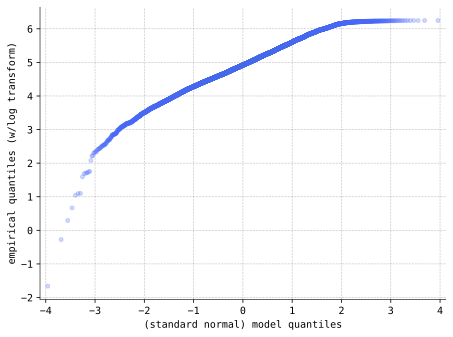

In [15]:
qqplot(data=srs_log, a=0.5, alpha=0.25)
plt.xlabel('(standard normal) model quantiles')
plt.ylabel('empirical quantiles (w/log transform)')
plt.tight_layout()

Notice that the points fall mostly along a straight line, except for a few points with log prices $\leq 2$, and a chunk of points with log prices near $6$. This latter discrepancy is another manifestation of the local peak in the dataset near a log price of $6$, or a price of $\$500$.

By visual inspection, it appears that the scattered points fall mostly along the line $y = 0.6x + 4.8$. This suggests that the best-fit normal model for the log-transformed data should be $\mathcal{N}(4.8, 0.6^2)$. Note how closely these parameter values match the empirical statistics of the log transformed data:

In [16]:
srs_log.rename('log price').describe()

count    13253.000000
mean         4.911520
std          0.672302
min         -1.660731
25%          4.486837
50%          4.920929
75%          5.379160
max          6.247966
Name: log price, dtype: float64

Instead of comparing the empirical quantiles to the normal model after log-transforming the data, it is instructive to compare the untransformed empirical quantiles directly to the log-normal model via a QQ-plot. This is the result:

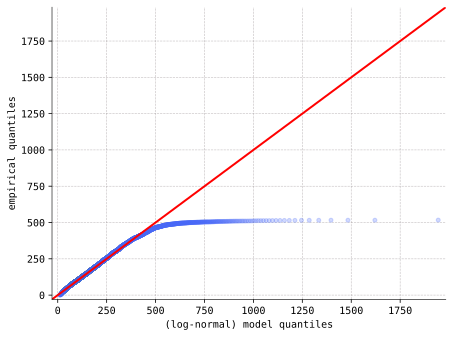

In [17]:
X = sp.stats.lognorm(s=srs_log.std(), scale=np.exp(srs_log.mean()))

qqplot(data=srs, dist=X, a=0.5, alpha=0.25, line='45')
plt.xlabel('(log-normal) model quantiles')
plt.ylabel('empirical quantiles')
plt.tight_layout()

Again, the discrepancy occurs near a price of $\$500$. Above this price, notice that the model quantiles are _larger_ than the empirical quantiles. This is consistent with a local peak in the dataset near $\$500$ that is not captured by the model. The intuition for this is best explained by comparing the data density function (obtained via KDE) against the model density function:

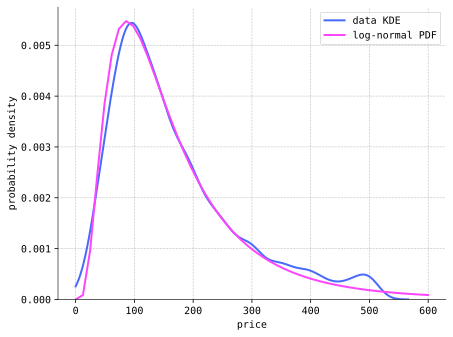

In [18]:
grid = np.linspace(srs.min(), 600)

sns.kdeplot(data=srs, label='data KDE', clip=(0, 600))
plt.plot(grid, X.pdf(grid), label='log-normal PDF')
plt.ylabel('probability density')
plt.legend()
plt.tight_layout()

Imagine sweeping from left to right across the horizontal axis approaching the peak near $\$500$, all the while accumulating probability (as area under the curve) from both the empirical and model distributions. Since the points along the QQ-plot fall mostly along a straight line till this peak, the empirical quantiles $y_i$ and model quantiles $x_i$ are in nearly the same positions along the horizontal axis (i.e, $y_i \approx x_i$). But as we begin entering the region near the peak, we begin to accumulate _more_ probability from the empirical distribution compared to the model distribution because the empirical density (and hence the area under the curve) begins to enter its local peak. This means that the empirical quantiles will begin to bunch more closely together compared to the model quantiles since you must step _further_ along the horizontal axis to accumulate the same amount of probability from the model distribution as you would from the empirical distribution over a shorter step. Thus, the model quantiles will be larger than the empirical quantiles.























## Box plots and violin plots

We finish the chapter with a discussion of two more methods to visualize datasets and empirical distributions. To begin, let's consider our Airbnb data and all the empirical statistics that we described and computed {numref}`empirical-stats`. We may combine all this information in something called a _box plot_ (or _box and whisker plot_):

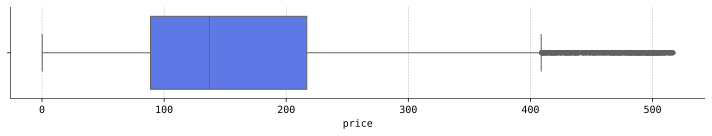

In [19]:
sns.boxplot(x=srs)
plt.xlabel('price')
plt.gcf().set_size_inches(w=10, h=2)
plt.tight_layout()

The left edge of the blue box is at $x=88.84$, which is the empirical $0.25$-quantile or first quartile; its right edge is at $x=216.84$, which is the empirical 0.75-quantile or third quartile. Therefore, the _width_ of the box is exactly the empirical IQR. The box thus represents where the middle 50% of the dataset lives. The vertical line through the box is at $x=137.13$, which is the empirical 0.5-quantile or the empirical median.

You notice that the box has "whiskers." In general, the left whisker in a box plot either extends out to the minimum value in the dataset _or_ to the threshold value

\begin{equation*}
(\text{empirical 0.25-quantile}) - 1.5\times (\text{empirical IQR})
\end{equation*}

for determining outliers, whichever is greater. In the case of our Airbnb data, the whisker extends to the minimum value at $x=0.19$ (19 cents---really?).

Likewise, the right whisker in general either extends out to the maximum value in the dataset _or_ to the upper threshold value

\begin{equation*}
(\text{empirical 0.75-quantile}) + 1.5\times (\text{empirical IQR})
\end{equation*}

for determining outliers, whichever is smaller. In the case of our Airbnb data, the dataset _does_ contain outliers in its upper tail, so the whisker extends to the threshold value, and all the dots to the right are outliers. Notice that these outliers are bunched so closely together that they actually appear as a solid, thick grey line in the plot.

Now, what were to happen if we combined a box plot and a KDE? We'd get something like this:

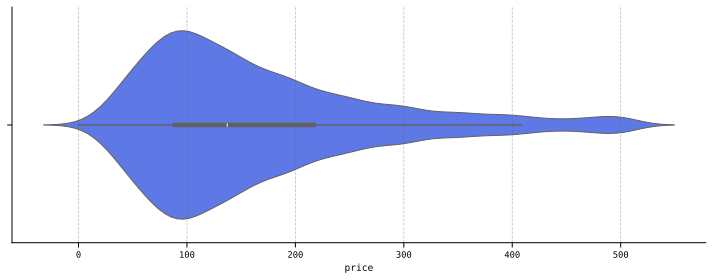

In [20]:
sns.set_context('paper')
sns.violinplot(x=srs)
plt.xlabel('price')
plt.gcf().set_size_inches(w=10, h=4)
plt.tight_layout()

This is a _violin plot_---the reason for the name is evident. Along the central horizontal line is a box plot---can you see it? The white dot in the box represents the empirical median, while you can see the upper and lower whiskers as well. Then, above the central horizontal line is displayed a KDE of the dataset, and its mirror image is displayed below. For comparison, here's a picture of a KDE of the dataset all on its own:

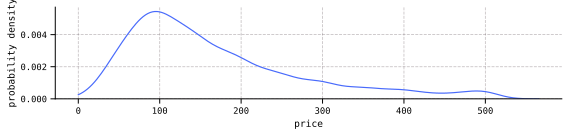

In [21]:
sns.kdeplot(x=srs, clip=(0, 600))
plt.gcf().set_size_inches(w=8, h=2)
plt.xlabel('price')
plt.ylabel('probability density')
plt.tight_layout()

So, violin plots are tools belonging to both graphical and numerical exploratory data analysis since they combine KDEs with box plots. They have advantages over just plain box plots because they are better able to convey a sense of the _shape_ of a dataset. For example, box plots cannot display multiple data modes (multiple peaks in the distribution), whereas KDEs _can_.